A data analysis dashboard on Bitcoin's trading history 

In [375]:
from yahoofinancials import YahooFinancials
import numpy as np
import datetime
from statsmodels.graphics.gofplots import qqplot
import plotly.express as px
import hvplot.pandas
import matplotlib.pyplot as plt
import hvplot.pandas
import plotly.express as px
from pathlib import Path
from panel.interact import interact
import panel as pn
from pandas_datareader import data as pdr
import pandas as pd
pn.extension('plotly')
import matplotlib 
%matplotlib inline
import scipy.stats
import seaborn as sns
from panel import widgets

In [376]:
start_sp = datetime.datetime(2010, 7, 16)
end_sp = datetime.datetime(2019, 10, 1)

#create dataframes

#SPDR S&P 500 ETF
SPX_df_inception = pdr.get_data_yahoo('SPY', start_sp, end_sp)

#iShares Core U.S. Aggregate Bond ETF
AGG_df_inception = pdr.get_data_yahoo('AGG', start_sp, end_sp)

#US Dollar/USDX - Index
USD_df_inception = pdr.get_data_yahoo('DX-Y.NYB', start_sp, end_sp)

#Bloomberg Commodity Index Total Return ETN (DJCI)
DJCI_df_inception = pdr.get_data_yahoo('DJCI', start_sp, end_sp)

#SPDR Gold Shares (GLD)
GLD_df_inception = pdr.get_data_yahoo('GLD', start_sp, end_sp)



In [377]:
SPX_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
SPX_df_inception.head()
AGG_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
AGG_df_inception.head()
USD_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
USD_df_inception.head()
DJCI_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
DJCI_df_inception.head()
GLD_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)

In [378]:

SPX_df_inception = SPX_df_inception.rename(columns = {"Close": "SPX Daily Returns"}) 
AGG_df_inception = AGG_df_inception.rename(columns = {"Close": "AGG Daily Returns"})
USD_df_inception = USD_df_inception.rename(columns = {"Close": "USD Daily Returns"}) 
DJCI_df_inception = DJCI_df_inception.rename(columns = {"Close": "DJCI Daily Returns"}) 
GLD_df_inception = GLD_df_inception.rename(columns = {"Close": "GLD Daily Returns"}) 

In [379]:
BTC_path = Path("BTC_trading_history.csv")
prices_BTC = pd.read_csv(BTC_path, index_col='Date', parse_dates=True, infer_datetime_format=True)
prices_BTC.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)

In [380]:
def annualized_return():


    start_sp = datetime.datetime(2014, 10, 1)
    end_sp = datetime.datetime(2019,10,1)
    BTC_df_inception = pdr.get_data_yahoo('BTC-USD', start_sp, end_sp)
    #SPDR S&P 500 ETF
    SPX_df_inception = pdr.get_data_yahoo('SPY', start_sp, end_sp)
    #iShares Core U.S. Aggregate Bond ETF
    AGG_df_inception = pdr.get_data_yahoo('AGG', start_sp, end_sp)
    #US Dollar/USDX - Index
    USD_df_inception = pdr.get_data_yahoo('DX-Y.NYB', start_sp, end_sp)
    #Bloomberg Commodity Index Total Return ETN (DJCI)
    DJCI_df_inception = pdr.get_data_yahoo('DJCI', start_sp, end_sp)
    #SPDR Gold Shares (GLD)
    GLD_df_inception = pdr.get_data_yahoo('GLD', start_sp, end_sp)

    BTC_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    SPX_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    AGG_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    USD_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    DJCI_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    GLD_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)

    BTC_df = BTC_df_inception.rename(columns = {"Close": "BTC"}) 
    SPX_df = SPX_df_inception.rename(columns = {"Close": "SPX"}) 
    AGG_df = AGG_df_inception.rename(columns = {"Close": "AGG"})
    USD_df = USD_df_inception.rename(columns = {"Close": "USD"}) 
    DJCI_df = DJCI_df_inception.rename(columns = {"Close": "DJCI"}) 
    GLD_df = GLD_df_inception.rename(columns = {"Close": "GLD"}) 
    
    
    combined_df_return = pd.concat([BTC_df, SPX_df, AGG_df, USD_df, DJCI_df, GLD_df],axis='columns', join="inner").pct_change()
    annualized_return = (combined_df_return.mean() * 252)*100
    
    returns_plot = plt.figure()
    returns = annualized_return.plot(kind="bar", title="Annualized Returns")
    plt.close(returns_plot)
   
    return pn.pane.Matplotlib(returns_plot)


In [381]:
def annualized_std():


    start_sp = datetime.datetime(2014, 10, 1)
    end_sp = datetime.datetime(2019,10,1)
    BTC_df_inception = pdr.get_data_yahoo('BTC-USD', start_sp, end_sp)
    #SPDR S&P 500 ETF
    SPX_df_inception = pdr.get_data_yahoo('SPY', start_sp, end_sp)
    #iShares Core U.S. Aggregate Bond ETF
    AGG_df_inception = pdr.get_data_yahoo('AGG', start_sp, end_sp)
    #US Dollar/USDX - Index
    USD_df_inception = pdr.get_data_yahoo('DX-Y.NYB', start_sp, end_sp)
    #Bloomberg Commodity Index Total Return ETN (DJCI)
    DJCI_df_inception = pdr.get_data_yahoo('DJCI', start_sp, end_sp)
    #SPDR Gold Shares (GLD)
    GLD_df_inception = pdr.get_data_yahoo('GLD', start_sp, end_sp)

    BTC_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    SPX_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    AGG_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    USD_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    DJCI_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    GLD_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)

    BTC_df = BTC_df_inception.rename(columns = {"Close": "BTC"}) 
    SPX_df = SPX_df_inception.rename(columns = {"Close": "SPX"}) 
    AGG_df = AGG_df_inception.rename(columns = {"Close": "AGG"})
    USD_df = USD_df_inception.rename(columns = {"Close": "USD"}) 
    DJCI_df = DJCI_df_inception.rename(columns = {"Close": "DJCI"}) 
    GLD_df = GLD_df_inception.rename(columns = {"Close": "GLD"}) 
    

    combined_df_std = pd.concat([BTC_df, SPX_df, AGG_df, USD_df, DJCI_df, GLD_df],axis='columns', join="inner").pct_change()
    annualized_std =  ((combined_df_std.std() * np.sqrt(252))*100)

    std_plot = plt.figure()
    std = annualized_std.plot(kind="bar", title="Annualized Volatility")
    plt.close(std_plot)
    
   
    return pn.pane.Matplotlib(std_plot)


In [382]:
def price_chart_daily_returns():
    BTC_path = Path("BTC_trading_history.csv")
    BTC_df = pd.read_csv(BTC_path, index_col='Date', parse_dates=True, infer_datetime_format=True)
    BTC_close = BTC_df["Close"].pct_change()
    price_chart_fig = plt.figure()
    price_chart = BTC_close.hist(bins=150, density=True, histtype="stepfilled", alpha=.5)
    plt.title("Histogram of Bitcoin Daily Returns", weight="bold")
    plt.xlabel("Daily Returns")
    plt.ylabel("Frequency")
    plt.yticks(range(0, 16))
    plt.xlim(xmin=-0.35, xmax = 0.45)
    plt.close(price_chart_fig)
    
    return pn.pane.Matplotlib(price_chart_fig)


def price_chart_daily_returns_SPX():
    start_sp = datetime.datetime(2010, 7, 16)
    end_sp = datetime.datetime(2019, 10, 1)
    spx_df = pdr.get_data_yahoo('SPY', start_sp, end_sp)
    spx_returns = spx_df['Close'].pct_change() 
    price_chart_spx = plt.figure()
    spx_returns.hist(bins=150, density=True, histtype="stepfilled", alpha=.5)
    plt.title("Histogram of SPDR S&P 500 ETF", weight="bold")
    plt.xlabel("Daily Returns")
    plt.ylabel("Frequency")
    #plt.yticks(range(0, 16))
    #plt.xlim(xmin=-0.35, xmax = 0.45)
    plt.close(price_chart_spx)
    
    return pn.pane.Matplotlib(price_chart_spx)

In [383]:
def q_plot():
    start_sp = datetime.datetime(2009, 1, 1)
    end_sp = datetime.datetime(2019, 10, 1)
    BTC_df = pdr.get_data_yahoo('BTC-USD', start_sp, end_sp) 
    BTC_df_daily_return = BTC_df["Close"].pct_change()
    plot_q = plt.figure()
    Q = BTC_df_daily_return
    probplot_q = scipy.stats.probplot(Q, dist=scipy.stats.norm, plot=plt.figure().add_subplot(111) )
    plt.title("Normal QQ-plot of Bitcoin Daily Log Returns", weight="bold")
    plt.close(plot_q)
    
    return pn.pane.Matplotlib(plot_q)



In [384]:
def choose_timeframe(year):
 
    
    return prices_BTC.loc[prices_BTC.index.year==year,:].hvplot.line(ylabel="Closing Price")

timeframe = prices_BTC.index.year.unique()

interact(choose_timeframe, year=timeframe)



Column
    [0] Column
        [0] DiscreteSlider(formatter='%d', name='year', options=[2010, 2011, 2012, ...], value=2010)
    [1] Row
        [0] HoloViews(Curve, name='interactive3202898')

In [385]:
def correlation_matrix():
    
    start_sp = datetime.datetime(2010, 7, 16)
    end_sp = datetime.datetime(2019, 10, 1)
    #SPDR S&P 500 ETF
    SPX_df_inception = pdr.get_data_yahoo('SPY', start_sp, end_sp)

    #iShares Core U.S. Aggregate Bond ETF
    AGG_df_inception = pdr.get_data_yahoo('AGG', start_sp, end_sp)

    #US Dollar/USDX - Index
    USD_df_inception = pdr.get_data_yahoo('DX-Y.NYB', start_sp, end_sp)

    #Bloomberg Commodity Index Total Return ETN (DJCI)
    DJCI_df_inception = pdr.get_data_yahoo('DJCI', start_sp, end_sp)

    #SPDR Gold Shares (GLD)
    GLD_df_inception = pdr.get_data_yahoo('GLD', start_sp, end_sp)
    
    SPX_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    AGG_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    USD_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    DJCI_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True) 
    GLD_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    
    SPX_df_inception = SPX_df_inception.rename(columns = {"Close": "SPX Daily Returns"}) 
    AGG_df_inception = AGG_df_inception.rename(columns = {"Close": "AGG Daily Returns"})
    USD_df_inception = USD_df_inception.rename(columns = {"Close": "USD Daily Returns"}) 
    DJCI_df_inception = DJCI_df_inception.rename(columns = {"Close": "DJCI Daily Returns"}) 
    GLD_df_inception = GLD_df_inception.rename(columns = {"Close": "GLD Daily Returns"})
    
    BTC_path = Path("BTC_trading_history.csv")
    prices_BTC = pd.read_csv(BTC_path, index_col='Date', parse_dates=True, infer_datetime_format=True)
    prices_BTC.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    prices_BTC = prices_BTC.rename(columns = {"Close": "BTC Daily Returns"})
    
    combined_df_inception_price = pd.concat([prices_BTC, SPX_df_inception, AGG_df_inception, USD_df_inception, DJCI_df_inception, GLD_df_inception],axis='columns', join="inner")
    combined_daily_return_inception = combined_df_inception_price.pct_change()
    correlation = combined_daily_return_inception.corr()
    
    return (correlation)
    

In [386]:
def correlation_heat_map():

    start_sp = datetime.datetime(2010, 7, 16)
    end_sp = datetime.datetime(2019, 10, 1)
    #SPDR S&P 500 ETF
    SPX_df_inception = pdr.get_data_yahoo('SPY', start_sp, end_sp)

    #iShares Core U.S. Aggregate Bond ETF
    AGG_df_inception = pdr.get_data_yahoo('AGG', start_sp, end_sp)

    #US Dollar/USDX - Index
    USD_df_inception = pdr.get_data_yahoo('DX-Y.NYB', start_sp, end_sp)

    #Bloomberg Commodity Index Total Return ETN (DJCI)
    DJCI_df_inception = pdr.get_data_yahoo('DJCI', start_sp, end_sp)

    #SPDR Gold Shares (GLD)
    GLD_df_inception = pdr.get_data_yahoo('GLD', start_sp, end_sp)
    
    SPX_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    AGG_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    USD_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    DJCI_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True) 
    GLD_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    
    SPX_df_inception = SPX_df_inception.rename(columns = {"Close": "SPX Daily Returns"}) 
    AGG_df_inception = AGG_df_inception.rename(columns = {"Close": "AGG Daily Returns"})
    USD_df_inception = USD_df_inception.rename(columns = {"Close": "USD Daily Returns"}) 
    DJCI_df_inception = DJCI_df_inception.rename(columns = {"Close": "DJCI Daily Returns"}) 
    GLD_df_inception = GLD_df_inception.rename(columns = {"Close": "GLD Daily Returns"})
    
    BTC_path = Path("BTC_trading_history.csv")
    prices_BTC = pd.read_csv(BTC_path, index_col='Date', parse_dates=True, infer_datetime_format=True)
    prices_BTC.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    prices_BTC = prices_BTC.rename(columns = {"Close": "BTC Daily Returns"})
    
    combined_df_inception_price = pd.concat([prices_BTC, SPX_df_inception, AGG_df_inception, USD_df_inception, DJCI_df_inception, GLD_df_inception],axis='columns', join="inner")
    combined_daily_return_inception = combined_df_inception_price.pct_change()
    correlation = combined_daily_return_inception.corr()
    heatmap_fig = plt.figure()
    heatmap = sns.heatmap(correlation)
    plt.close(heatmap_fig)
    
    return pn.pane.Matplotlib(heatmap_fig)

In [387]:
def beta():
    
    start_sp = datetime.datetime(2014, 10, 1)
    end_sp = datetime.datetime(2019, 10, 1)
    SPX_df = pdr.get_data_yahoo('SPY', start_sp, end_sp)
    BTC_df = pdr.get_data_yahoo('BTC-USD', start_sp, end_sp) 
    SPX_df.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    BTC_df.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    BTC_df_close_returns = SPX_df.rename(columns = {"Close": "BTC Daily Returns"}) 
    SPX_df_close_returns = BTC_df.rename(columns = {"Close": "SPX Daily Returns"}) 
    combined_df_close = pd.concat([BTC_df_close_returns, SPX_df_close_returns],axis='columns', join="inner").pct_change()
    rolling_covariance_btc =  combined_df_close["BTC Daily Returns"].rolling(window=60).cov(combined_df_close["SPX Daily Returns"])
    rolling_variance =  combined_df_close["SPX Daily Returns"].rolling(window=60).var()
    rolling_btc_beta = rolling_covariance_btc / rolling_variance
    rolling_btc_beta = rolling_btc_beta
    mc = rolling_btc_beta.hvplot.line(x='Date', y='0', title='Rolling 60-Day Beta of Bitcoin', shared_axes=False)
    
    return (mc)
#

In [388]:
def sharpe_ratios_compare():


    start_sp = datetime.datetime(2014, 10, 1)
    end_sp = datetime.datetime(2019,10,1)
    BTC_df_inception = pdr.get_data_yahoo('BTC-USD', start_sp, end_sp)
    #SPDR S&P 500 ETF
    SPX_df_inception = pdr.get_data_yahoo('SPY', start_sp, end_sp)
    #iShares Core U.S. Aggregate Bond ETF
    AGG_df_inception = pdr.get_data_yahoo('AGG', start_sp, end_sp)
    #US Dollar/USDX - Index
    USD_df_inception = pdr.get_data_yahoo('DX-Y.NYB', start_sp, end_sp)
    #Bloomberg Commodity Index Total Return ETN (DJCI)
    DJCI_df_inception = pdr.get_data_yahoo('DJCI', start_sp, end_sp)
    #SPDR Gold Shares (GLD)
    GLD_df_inception = pdr.get_data_yahoo('GLD', start_sp, end_sp)

    BTC_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    SPX_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    AGG_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    USD_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    DJCI_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    GLD_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)

    BTC_df = BTC_df_inception.rename(columns = {"Close": "BTC"}) 
    SPX_df = SPX_df_inception.rename(columns = {"Close": "SPX"}) 
    AGG_df = AGG_df_inception.rename(columns = {"Close": "AGG"})
    USD_df = USD_df_inception.rename(columns = {"Close": "USD"}) 
    DJCI_df = DJCI_df_inception.rename(columns = {"Close": "DJCI"}) 
    GLD_df = GLD_df_inception.rename(columns = {"Close": "GLD"}) 
    
    combined_df = pd.concat([BTC_df, SPX_df, AGG_df, USD_df, DJCI_df, GLD_df],axis='columns', join="inner").pct_change()
    sharpe_ratios = (combined_df.mean() * 252) / (combined_df.std() * np.sqrt(252))
    sr_plot = plt.figure()
    sharpe_plot = sharpe_ratios.plot(kind="bar", title="Sharpe Ratios")
    plt.close(sr_plot)
    
    return pn.pane.Matplotlib(sr_plot)


In [389]:
def sharpe_ratios_compare_three():


    start_sp = datetime.datetime(2016, 10, 1)
    end_sp = datetime.datetime(2019,10,1)
    BTC_df_inception = pdr.get_data_yahoo('BTC-USD', start_sp, end_sp)
    #SPDR S&P 500 ETF
    SPX_df_inception = pdr.get_data_yahoo('SPY', start_sp, end_sp)
    #iShares Core U.S. Aggregate Bond ETF
    AGG_df_inception = pdr.get_data_yahoo('AGG', start_sp, end_sp)
    #US Dollar/USDX - Index
    USD_df_inception = pdr.get_data_yahoo('DX-Y.NYB', start_sp, end_sp)
    #Bloomberg Commodity Index Total Return ETN (DJCI)
    DJCI_df_inception = pdr.get_data_yahoo('DJCI', start_sp, end_sp)
    #SPDR Gold Shares (GLD)
    GLD_df_inception = pdr.get_data_yahoo('GLD', start_sp, end_sp)

    BTC_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    SPX_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    AGG_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    USD_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    DJCI_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    GLD_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)

    BTC_df = BTC_df_inception.rename(columns = {"Close": "BTC"}) 
    SPX_df = SPX_df_inception.rename(columns = {"Close": "SPX"}) 
    AGG_df = AGG_df_inception.rename(columns = {"Close": "AGG"})
    USD_df = USD_df_inception.rename(columns = {"Close": "USD"}) 
    DJCI_df = DJCI_df_inception.rename(columns = {"Close": "DJCI"}) 
    GLD_df = GLD_df_inception.rename(columns = {"Close": "GLD"}) 
    
    combined_df = pd.concat([BTC_df, SPX_df, AGG_df, USD_df, DJCI_df, GLD_df],axis='columns', join="inner").pct_change()
    sharpe_ratios = (combined_df.mean() * 252) / (combined_df.std() * np.sqrt(252))
    sr_plot = plt.figure()
    sharpe_plot = sharpe_ratios.plot(kind="bar", title="Sharpe Ratios")
    plt.close(sr_plot)
    
    return pn.pane.Matplotlib(sr_plot)

In [390]:
def sharpe_ratios_compare_one():


    start_sp = datetime.datetime(2018, 10, 1)
    end_sp = datetime.datetime(2019,10,1)
    BTC_df_inception = pdr.get_data_yahoo('BTC-USD', start_sp, end_sp)
    #SPDR S&P 500 ETF
    SPX_df_inception = pdr.get_data_yahoo('SPY', start_sp, end_sp)
    #iShares Core U.S. Aggregate Bond ETF
    AGG_df_inception = pdr.get_data_yahoo('AGG', start_sp, end_sp)
    #US Dollar/USDX - Index
    USD_df_inception = pdr.get_data_yahoo('DX-Y.NYB', start_sp, end_sp)
    #Bloomberg Commodity Index Total Return ETN (DJCI)
    DJCI_df_inception = pdr.get_data_yahoo('DJCI', start_sp, end_sp)
    #SPDR Gold Shares (GLD)
    GLD_df_inception = pdr.get_data_yahoo('GLD', start_sp, end_sp)

    BTC_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    SPX_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    AGG_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    USD_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    DJCI_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
    GLD_df_inception.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)

    BTC_df = BTC_df_inception.rename(columns = {"Close": "BTC"}) 
    SPX_df = SPX_df_inception.rename(columns = {"Close": "SPX"}) 
    AGG_df = AGG_df_inception.rename(columns = {"Close": "AGG"})
    USD_df = USD_df_inception.rename(columns = {"Close": "USD"}) 
    DJCI_df = DJCI_df_inception.rename(columns = {"Close": "DJCI"}) 
    GLD_df = GLD_df_inception.rename(columns = {"Close": "GLD"}) 
    
    combined_df = pd.concat([BTC_df, SPX_df, AGG_df, USD_df, DJCI_df, GLD_df],axis='columns', join="inner").pct_change()
    sharpe_ratios = (combined_df.mean() * 252) / (combined_df.std() * np.sqrt(252))
    sr_plot = plt.figure()
    sharpe_plot = sharpe_ratios.plot(kind="bar", title="Sharpe Ratios")
    plt.close(sr_plot)
    
    return pn.pane.Matplotlib(sr_plot)


In [391]:
start_sp = datetime.datetime(2014, 10, 1)
end_sp = datetime.datetime(2019,10,1)
BTC_df = pdr.get_data_yahoo('BTC-USD', start_sp, end_sp)
BTC_df.drop(columns=['High', 'Low', 'Open', 'Volume', 'Adj Close'], inplace=True)
BTC_returns = BTC_df['Close'].pct_change()
BTC_df_avg_returns = BTC_returns.mean()
BTC_df_avg_std = BTC_returns.std()
BTC_last_price = BTC_df['Close'][-1]

def get_simulations(num_simulations, num_trading_days):
    num_simulations = 1000
    num_trading_days = 365 
    
    simulated_BTC_price_df = pd.DataFrame()
    
    for n in range (num_simulations):
        
        simulated_BTC_prices = [BTC_last_price]
        
        for i in range(num_trading_days):
        # Calculate the simulated price using the last price within the list
            simulated_price = simulated_BTC_prices[-1] * (1 + np.random.normal(BTC_df_avg_returns, BTC_df_avg_std))
            
        # Append the simulated price to the list
            simulated_BTC_prices.append(simulated_price)
        
        simulated_BTC_price_df[f"Simulation {n+1}"] = pd.Series(simulated_BTC_prices)            
          
    return (simulated_BTC_price_df)

def get_simulations_plot():
    
    plot_title = (f"1000 Simulations of Bitcoin Price Trajectory")
    simulated_returns = simulated_BTC_price_df.hvplot(
    title=plot_title, legend=False, shared_axes=False).opts(yformatter="%0f", bgcolor="lightgray", xlabel='Bitcoin Price')
    
    return (simulated_returns)


simulated_BTC_price_df = get_simulations(1000, 365)
simulated_ending_prices = simulated_BTC_price_df.iloc[-1, :]
simulated_ending_prices.head()

# Print head of DataFrame
    
simulated_BTC_price_df.tail()

def confidence_interval():
    
    plot_title_figure = f"Bitcoin Price 95% Confidence Intervals"
    confidence_interval = simulated_ending_prices.quantile(q=[0.025, 0.975])
    conf_int = plt.figure()
    simulated_ending_prices.plot(kind="hist", bins=25)
    plt.axvline(confidence_interval.iloc[0], color="r")
    plt.axvline(confidence_interval.iloc[1], color="r")
    plt.suptitle(plot_title_figure)
    plt.close

    return (conf_int)



In [ ]:
title = '#Bitcoin Data Analysis'
subtitle = "Bitcoin reached a record high of $19,783 on December 17, 2017. As of October 2019 the price remains ~60% below its peak. In this dashboard, we explore Bitcoin's trading history and compare it against other risky asset classes."
commentary_daily_returns = "Based on the plot visuals, we can assume Bitcoin follows a normal distribution and therefore, can be analyzed with traditional statistical analysis."
commentary_correlation = 'Bitcoin, since inception, has shown a very low correlaton to the SPDR S&P 500 ETF, Shares Core U.S. Aggregate Bond ETF,US Dollar/USDX - Index, Bloomberg Commodity Index, SPDR Gold Shares. Bitcoin effectively has no discernible correlation with the range of risky assets we selected and over any of the periods we selected. Bitcoin appears to be a unique idiosyncratic risk factor; and despite its volatility and uncertain trajectory, would likely provide diversification and hedging benefits if included in a portfolio of risky assets'
commentary_beta = 'Bitcoin has a beta to the S&P 500 close to zero, indicating a very low volatility in relation to the equity market'
commentary_sharpe = 'Bitcoin’s return profile has shown superior absolute returns and risk-adjusted returns since inception and over some of our medium-term observation periods. However – caveat emptor - as the data series had displayed a parabolic-like price appreciation in earlier years and appears to have been displaying a much different trend following its price peak.'
commentary_sharpe_five = 'Comparison of sharpe ratios over a five year period'
commentary_sharpe_one = 'Comparison of sharpe ratios over a one year period'
commentary_sharpe_three = 'Comparison of sharpe ratios over a three year period'
commentary_monte_carlo = 'Based on the Monte Carlo simulations, Bitcoin has the potential to significantly increase in value over time. However, it has been a very volatile data series since inception and its future carries a high degree of uncertainty.'
commentary_vol = 'Annualized returns and volatility for Bitcoin over a five year period is significantly above the SPDR S&P 500 ETF, Shares Core U.S. Aggregate Bond ETF,US Dollar/USDX - Index, Bloomberg Commodity Index, and SPDR Gold Shares'
price_tab_interactive = pn.Row(pn.Column(title, subtitle), interact(choose_timeframe, year=timeframe))

price_chart_inception = pn.Column(commentary_daily_returns, price_chart_daily_returns(), price_chart_daily_returns_SPX())

vol = pn.Column(commentary_vol, annualized_return(), annualized_std()) 

corr = pn.Column(commentary_correlation, correlation_matrix(), pn.Row(correlation_heat_map()))

beta_tab = pn.Column(commentary_beta, beta())

sharpe_ratio_tab = pn.Column(commentary_sharpe, commentary_sharpe_five, sharpe_ratios_compare(), commentary_sharpe_three, sharpe_ratios_compare_three(), commentary_sharpe_one, sharpe_ratios_compare_one())

monte_carlo_tab = pn.Column(commentary_monte_carlo, get_simulations_plot(), confidence_interval())

# Create tabs
BTC_dashboard = pn.Tabs(("Price Chart", price_tab_interactive), ("Normal Distribution", price_chart_inception), ("Annualized Returns and Volatility", vol), ("Sharpe Ratios", sharpe_ratio_tab), ("Correlation", corr), ("Beta", beta_tab),  ("Monte Carlo Simulations", monte_carlo_tab))
        

Tabs
    [0] Row
        [0] Column
            [0] Markdown(str)
            [1] Markdown(str)
        [1] Column
            [0] Column
                [0] DiscreteSlider(formatter='%d', name='year', options=[2010, 2011, 2012, ...], value=2010)
            [1] Row
                [0] HoloViews(Curve, name='interactive3112266')
    [1] Column
        [0] Markdown(str)
        [1] Matplotlib(Figure)
        [2] Matplotlib(Figure)
    [2] Column
        [0] Markdown(str)
        [1] Matplotlib(Figure)
        [2] Matplotlib(Figure)
    [3] Column
        [0] Markdown(str)
        [1] Markdown(str)
        [2] Matplotlib(Figure)
        [3] Markdown(str)
        [4] Matplotlib(Figure)
        [5] Markdown(str)
        [6] Matplotlib(Figure)
    [4] Column
        [0] Markdown(str)
        [1] HTML(DataFrame)
        [2] Row
            [0] Matplotlib(Figure)
    [5] Column
        [0] Markdown(str)
        [1] HoloViews(Curve)
    [6] Column
        [0] Markdown(str)
        [1] HoloViews(NdOverlay)
        [2] Matplotlib(Figure)
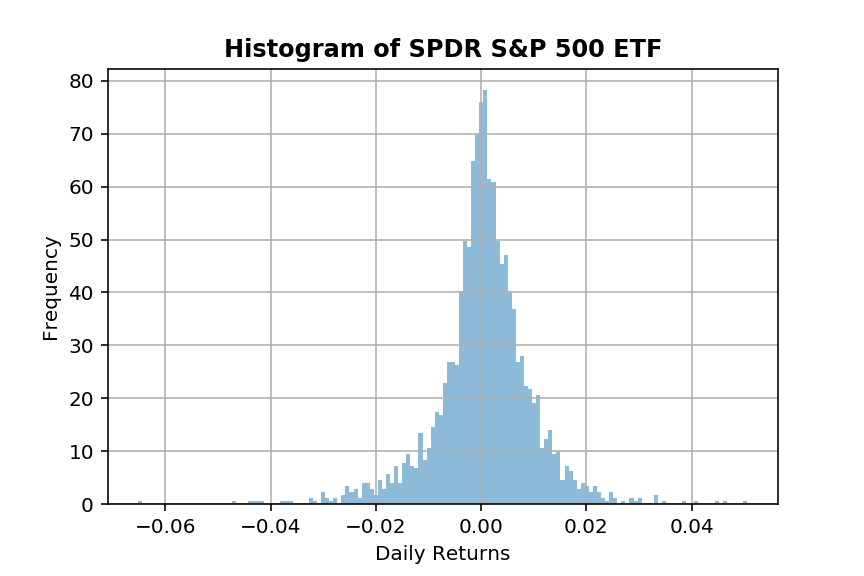
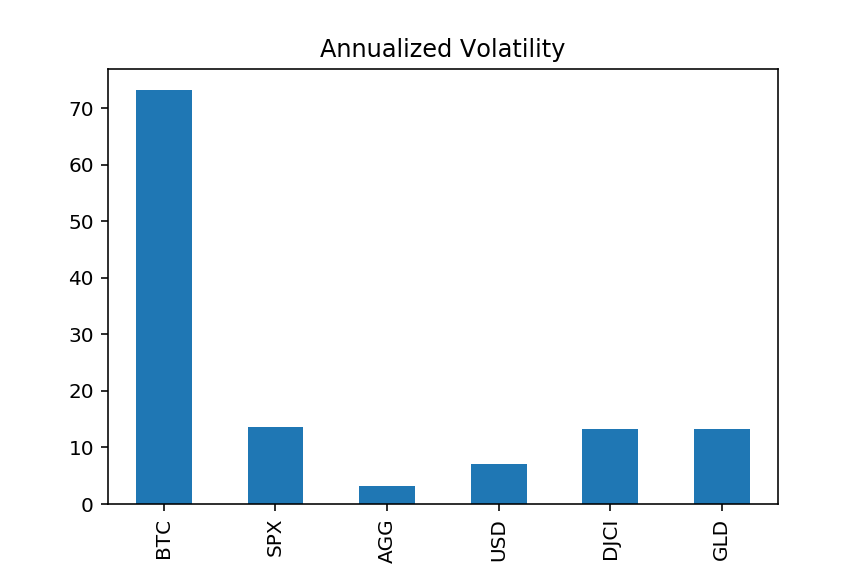
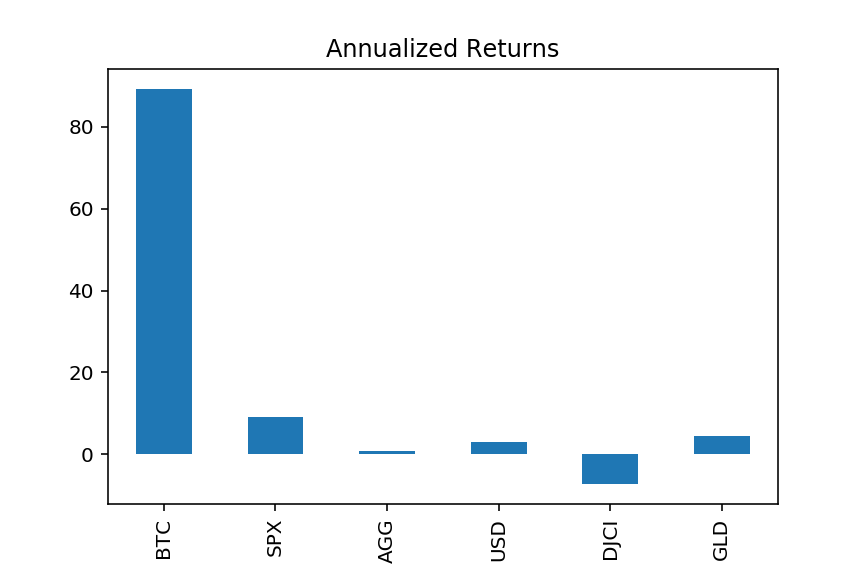
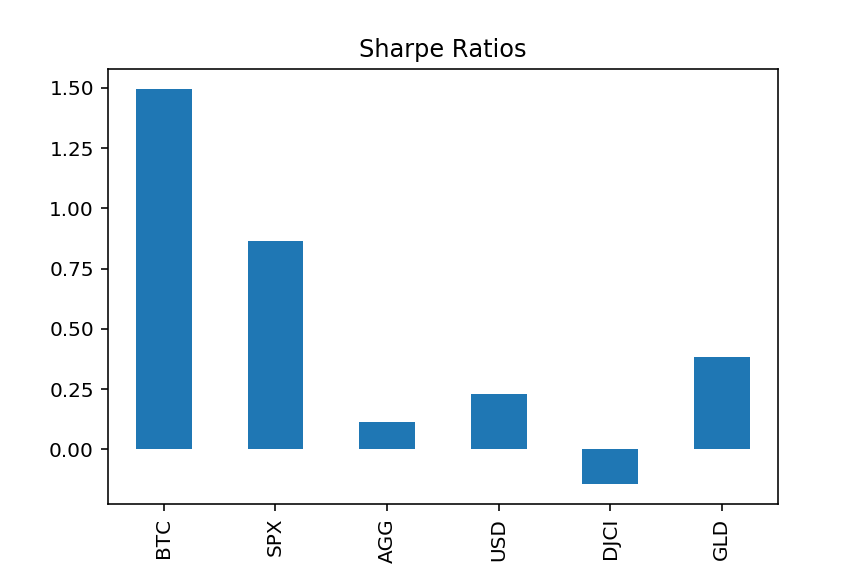
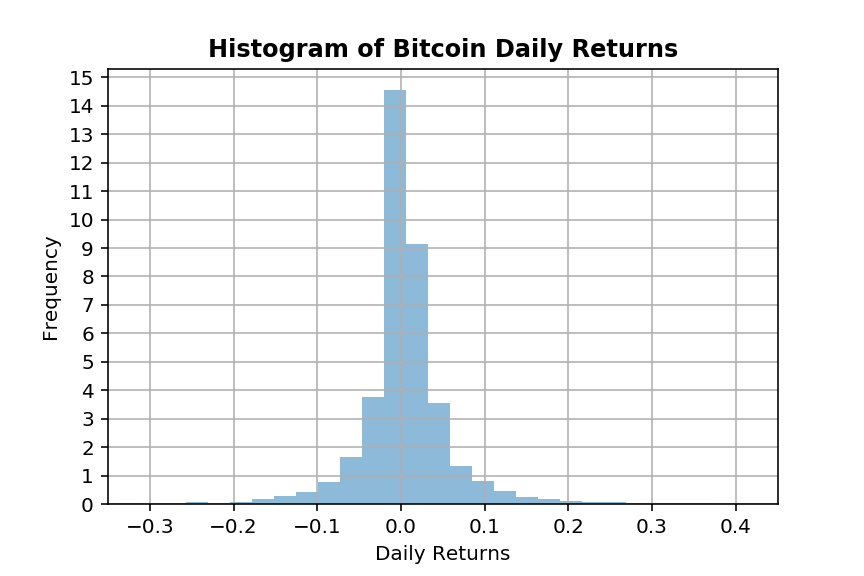
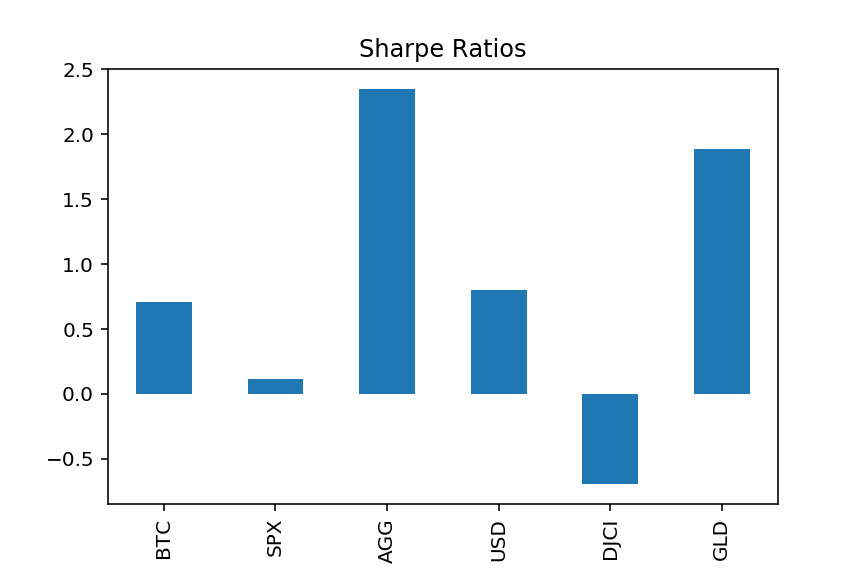
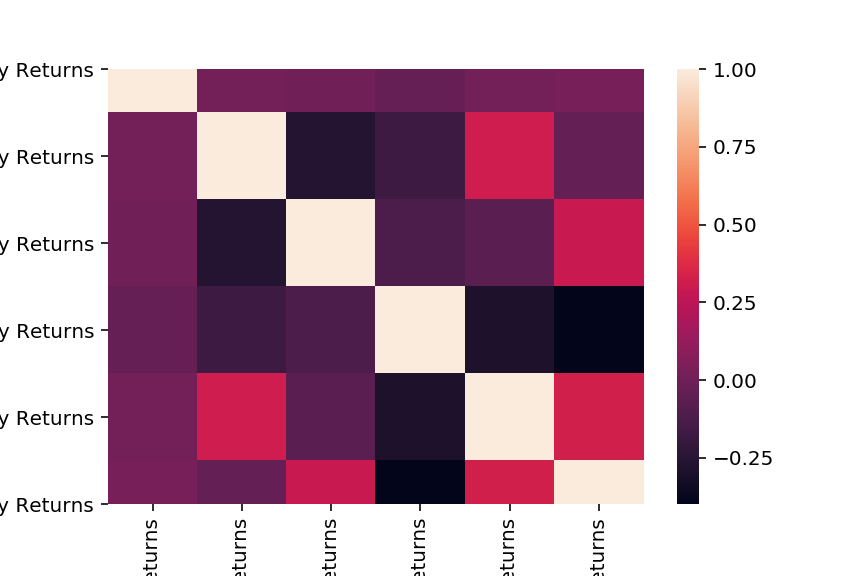
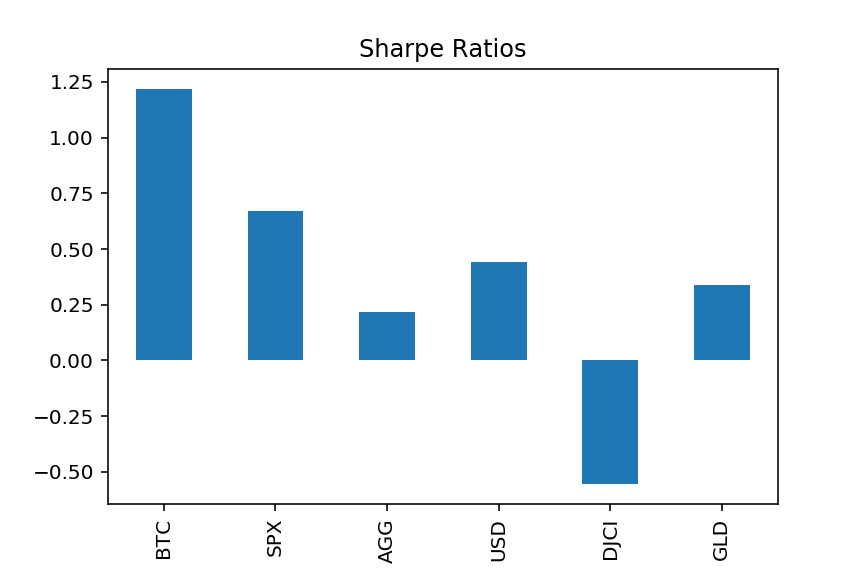
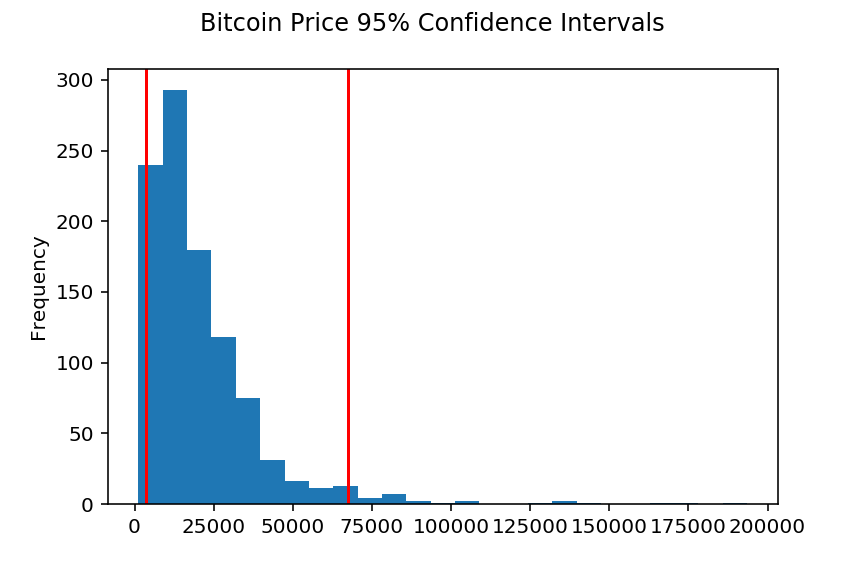

In [392]:
BTC_dashboard